In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, ArtistAnimation
import scipy.optimize as opt
import scipy.signal as sig
import scipy.integrate as sciint
from functools import partial
from itertools import product
from collections import namedtuple
import pickle as pkl
import os


# Mine
from wilson_cowan_2d.simulations import concrete_wc_kernel as wck
from wilson_cowan_2d.simulations import wc_params as wcp
from wilson_cowan_2d.simulations.nonlinear_functions import decreasing_exponential
from wilson_cowan_2d.analysis.nulclines import calc_cross_points, calc_nulclines_crosspoints
from wilson_cowan_2d.utils import make_counter

from IPython.display import HTML, clear_output
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

%load_ext autoreload
%autoreload 2

In [2]:
report_path = "/home/nicolasjudd/school_notes/neural/final_report/"
img_path = os.path.join(report_path, 'img')

center = namedtuple("Center", ('x', 'y'))

In [3]:
# Data path
data_path = "../data/"
analysis_fldr = "SSN_2D_Simulations"
data_save_path = os.path.join(data_path, analysis_fldr)
if not os.path.exists(data_save_path):
    os.makedirs(data_save_path)

In [4]:
# τ = 3.8
# τe = 1
# τi = τ * τe

# σ = 0.9
# σe = 1
# σi = σ* σe


# A = np.array(( [1.5, 1]
#               ,[10, 1]))
# Θ = np.array([-0.7, -0.01])

τ = 0.45
τe = 1
τi = τ * τe

σ = 0.5 # 7.6625  # .6625
σe = 10
σi = σ* σe



# A = np.array(( [1.5, 1]
#               ,[0.5, 0.1]))
# Θ = np.array([0.125, 0.4])


n = 3
k = 0.8

A=np.array([[1, 1.5], [1, 0.25]])
Θ=np.array([0.001, 1.8])

param = wcp.SSNDefaultParams(n=n, k=k, size = 2**5+1,
                             σ=np.array([σe,σi]), τ = np.array([τe, τi])
                            ,A = A, Θ=Θ)

u_str = 0
v_str = 0

hf_size = param.size//2
x,y = np.ogrid[-hf_size:hf_size+1,-hf_size:hf_size+1]

def center_disk(c: center, strength: float, radius: float):
    return  strength * ((x + c.x)**2 + (y + c.y)**2 <= radius ** 2)

radius = 10
# cs = (center(-param.size * 1/4, 0), center(param.size * 1/4, 0))  # Center of impulse
cs = (center(0,0), center(param.size//2, param.size//2))
uss = (0.00, 1)
vss = (0, 0.000)
u = np.sum(tuple((center_disk(c, s, radius) for c, s in zip(cs, uss))), axis=0)
v = np.sum(tuple((center_disk(c, s, radius) for c, s in zip(cs, vss))), axis=0)
# v = v_str*np.ones((param.size, param.size))

#  inp = (u3, v3, u3, 0)

inp = (u, v)

In [ ]:
end = 100
step = 1/15 # Usually a good number
count = make_counter(end, rate=5)
boundary='symm'

#

res = wck.WCDecExpTravelNonLocal2D(inp, param)(
    (0, end),  t_eval=np.arange(0, end, step), args=(count, boundary,))

print(res.message)

⠉⠩ Time Step: 0037/0100 Percent Done: 37.3%


In [ ]:
times = res.y.T.reshape(len(res.t), 2, param.size, param.size)

new_u = times[:, 0, :, :]
new_v = times[:, 1, :, :]

In [ ]:
test_list = list(new_u)
im = plt.imshow(new_u[:, :, param.size//2], vmin=0, vmax=2)
plt.colorbar(im)
# plt.savefig(os.path.join(img_path
# ,f"2d_u_profile_ssn_single_spot_test_sig={σ}_tau={τ}_boundary={boundary}.png"))

In [ ]:
im = plt.imshow(new_v[:, :, param.size//2], vmin=0, vmax=30)
plt.colorbar(im)
# plt.savefig(os.path.join(img_path
# ,f"2d_v_profile_ssn_single_spot_test_sig={σ}_tau={τ}_boundary={boundary}.png"))

In [ ]:
test_list = list(new_u)

fig, ax = plt.subplots()
vmin=0
vmax=1

im1 = ax.imshow(test_list[0], vmin=vmin, vmax=vmax)
cnt = make_counter(len(test_list), rate=5, wait=True)
plt.colorbar(im1)

def update_gif(i, plot, ims):
    _ = plot.set_data(test_list[i])
    cnt(i)
    return plot,

anim = FuncAnimation(fig, partial(update_gif, plot=im1, ims=test_list)
                     ,frames=range(1, len(test_list),1),interval=1_000/60, blit=True)

HTML(anim.to_html5_video())

In [90]:
anim.save(os.path.join(img_path, f"ssn_new_param_single_spot_test_sig={σ}_tau={τ}_boundary={boundary}.gif"))

⠉⠙ Time Step: 1497/1500 Percent Done: 99.8%


In [91]:
os.path.abspath(img_path)

'/home/nicolasjudd/school_notes/neural/final_report/img'

⠉⠩ Time Step: 1497/1500 Percent Done: 99.8%


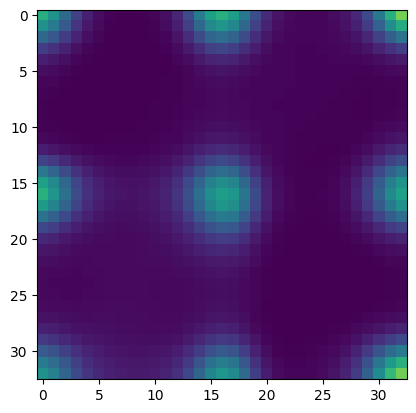

In [92]:
test_list = list(new_v)

fig, ax = plt.subplots()
vmin=0
vmax=10

im1 = ax.imshow(test_list[0], vmin=vmin, vmax=vmax)
cnt = make_counter(len(test_list), rate=5, wait=True)

def update_gif(i, plot, ims):
    _ = plot.set_data(test_list[i])
    cnt(i)
    return plot,

anim = FuncAnimation(fig, partial(update_gif, plot=im1, ims=test_list)
                     ,frames=range(1, len(test_list),1),interval=1_000/240, blit=True)

HTML(anim.to_html5_video())

In [289]:
anim.save(os.path.join(img_path, f"2_spot_test_sig={σ}_tau={τ}.gif"))

⢂⠀ Time Step: 0147/0150 Percent Done: 98.0%


⠉⠩ Time Step: 1496/1500 Percent Done: 99.7%


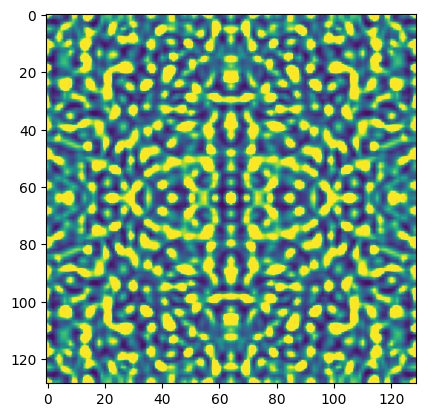

In [483]:
fig, ax = plt.subplots()
vmin=0
vmax=4

im1 = ax.imshow(test_list[0], vmin=vmin, vmax=vmax)
cnt = make_counter(len(test_list), rate=5, wait=True)

def update_gif(i, plot, ims):
    _ = plot.set_data(test_list[i])
    cnt(i)
    return plot,

anim = FuncAnimation(fig, partial(update_gif, plot=im1, ims=test_list)
                     ,frames=range(0, len(test_list)),interval=1_000/120, blit=True)

HTML(anim.to_html5_video())

In [503]:
with open(os.path.join(data_save_path,
                       f"ssn_2center_{ss}_2d_sig={σ}_tau={τ}_center=({c.x},{c.y}).pkl")
          , "wb") as w:
    pkl.dump(res, w)

In [267]:
test = anim.to_html5_video()

with open(os.path.join(img_path, f"ssn_2d_traveling_pulse_sig={σ}_tau={τ}_boundary={boundary}"+".html"), 'w') as w:
    w.write(test)

3036939

In [305]:
param = wcp.SSNDefaultParams(τ = np.array([τe, τi]), size = 2**7+1, σ=np.array([σe,σi]), n=3, k=1)

hf_size = param.size//2
x,y = np.ogrid[-hf_size:hf_size+1,-hf_size:hf_size+1]
radius = 10  # Radius of impulse disk
c_points = (0, 10, -10, param.size - 10, -param.size + 10)
centers = tuple(center(x, y) for x,y in product(c_points, c_points))

boundary='symm'
end = 100
step = 1/60 # Usually a good number
count = make_counter(end, rate=100)

In [306]:
results = list()
for c in centers:

    u = ((x + c.x)**2 + (y + c.y)**2 <= radius ** 2) * 0.5
    v = v_str*np.ones((param.size, param.size))
    inp = (u, v)

    res = wck.WCDecExpTravelNonLocal2D(inp, param)(
        (0, end), t_eval=np.arange(0, end, step), args=(count, boundary,))
    
    with open(os.path.join(data_save_path, f"ssn_2d_sig={σ}_tau={τ}_center=({c.x},{c.y}).pkl"), "wb") as w:
        pkl.dump(res, w)
    
    results.append(res)


⠈⠩ Time Step: 0099/0100 Percent Done: 99.9%



KeyboardInterrupt



In [314]:
res = results[-1]

u, v = res.y.T.reshape(2, len(res.t), param.size, param.size)
u = list(u)

⠉⠩ Time Step: 5984/6000 Percent Done: 99.7%


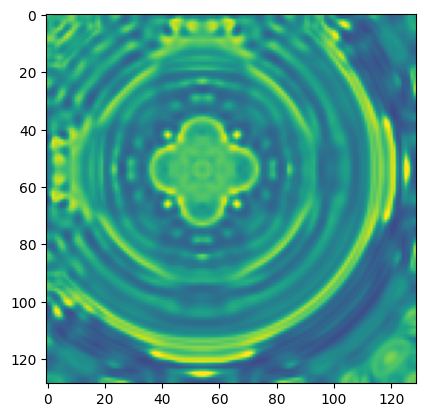

In [315]:
fig, ax = plt.subplots()
vmin=0
vmax=2

im1 = ax.imshow(u[0], vmin=vmin, vmax=vmax)
cnt = make_counter(len(test_list), rate=5, wait=True)

def update_gif(i, plot, ims):
    _ = plot.set_data(u[i])
    cnt(i)
    return plot,

anim = FuncAnimation(fig, partial(update_gif, plot=im1, ims=u)
                     ,frames=range(0,len(u), 4),interval=1_000/120, blit=True)

HTML(anim.to_html5_video())

In [316]:
res = results[2]

u, v = res.y.T.reshape(2, len(res.t), param.size, param.size)
u = list(u)

⠉⠩ Time Step: 5984/6000 Percent Done: 99.7%


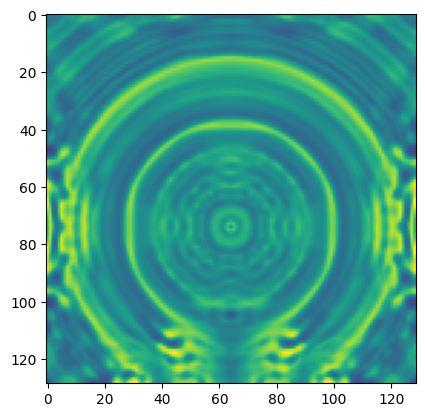

In [317]:
fig, ax = plt.subplots()
vmin=0
vmax=2

im1 = ax.imshow(u[0], vmin=vmin, vmax=vmax)
cnt = make_counter(len(test_list), rate=5, wait=True)

def update_gif(i, plot, ims):
    _ = plot.set_data(u[i])
    cnt(i)
    return plot,

anim = FuncAnimation(fig, partial(update_gif, plot=im1, ims=u)
                     ,frames=range(0,len(u), 4),interval=1_000/120, blit=True)

HTML(anim.to_html5_video())